In [1]:
import os
import sys
import numpy as np
import torch
import ast
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

In [2]:
sys.path.append("../authorship_attribution/")
sys.path.append("../obfuscated_ast_similarity//")

In [3]:
import model as ast_model
import train as ast_train
import utilities as ast_utilities
import obfuscation
import json
import obfuscated_trainer

In [4]:
original_path = "../authorship_attribution/experiments/GCJ-108/plain/"

In [5]:
# complete_model = ast_utilities.load_plain_model(complete_model, )
# model_params = json.loads(open(os.path.join(path, "components", "ast_encoder_params.json")).read())
model_params = json.loads(open(os.path.join(original_path, "best_state", "components", "ast_encoder_params.json")).read())


In [42]:
ast_encoder = ast_model.ASTEncoder(model_params)
ast_encoder.load(os.path.join(original_path, "best_state", "components"))

In [25]:
batcher = obfuscated_trainer.SimilarityBatcher({}, 0.8)
batcher.load_from_attribution_batcher(original_path)
# batcher.load_from_attribution_batcher("../authorship_attribution/experiments/GCJ-108/regularized-sep-coef-names/")
# batcher.load(original_path)

In [8]:
# batcher.train_data

In [9]:
# data = ast_utilities.read_all_gcj()

In [10]:
# data = ast_utilities.filter_by_count(data, 15, 1000)
# batcher = obfuscated_trainer.Batcher(data, 0.8)

In [56]:
# obfuscation_params = {
#     'add_kvargs':0.5,
#     'add_args':0.5,
#     'args_max_add':5,
#     'add_call_args':0.5,
#     'call_args':3,
#     'call_kwargs':3,
#     'if_swap':0.5,
#     'modify_body':0.5,
#     'n_modification_depth':3,
#     'max_trash_to_body':3,
#     'swap_in_body':0.5
# }

# obfuscation_params = {
#     'add_kvargs':0.8,
#     'add_args':0.8,
#     'args_max_add':8,
#     'add_call_args':0.8,
#     'call_args':5,
#     'call_kwargs':5,
#     'if_swap':0.7,
#     'modify_body':0.7,
#     'n_modification_depth':5,
#     'max_trash_to_body':5,
#     'swap_in_body':0.6
# }

# obfuscation_params = {
#     'add_kvargs':0.3,
#     'add_args':0.3,
#     'args_max_add':3,
#     'add_call_args':0.5,
#     'call_args':3,
#     'call_kwargs':3,
#     'if_swap':0.4,
#     'modify_body':0.4,
#     'n_modification_depth':2,
#     'max_trash_to_body':5,
#     'swap_in_body':0.5
# }

obfuscation_params = {
    'add_kvargs':0.3,
    'add_args':0.3,
    'args_max_add':10,
    'add_call_args':0.5,
    'call_args':10,
    'call_kwargs':10,
    'if_swap':0.5,
    'modify_body':0.4,
    'n_modification_depth':3,
    'max_trash_to_body':5,
    'swap_in_body':0.5
}


# obfuscation_params = {
#     'add_kvargs':0.0,
#     'add_args':0.0,
#     'args_max_add':0,
#     'add_call_args':0.0,
#     'call_args':0,
#     'call_kwargs':0,
#     'if_swap':0.0,
#     'modify_body':0.0,
#     'n_modification_depth':0,
#     'max_trash_to_body':0,
#     'swap_in_body':0.0
# }

obfuscation_params_subseq = {
    'add_kvargs':0.3,
    'add_args':0.3,
    'args_max_add':10,
    'add_call_args':0.5,
    'call_args':10,
    'call_kwargs':10,
    'if_swap':0.5,
    'modify_body':0.4,
    'n_modification_depth':3,
    'max_trash_to_body':5,
    'swap_in_body':0.5,
    "type":"extract_fragments",
    "n_patches":4,
    "inflate":1.5,
    "deflate":0.5
}


In [18]:
# print()

In [19]:
long_names = obfuscated_trainer.order_names_by_count(batcher)

In [20]:
# validation_before = obfuscated_trainer.validate(ast_encoder, batcher, long_names, obfuscation_params, max_for_user=100, n_obfuscated=2)

In [30]:

# trainer_params = dict(
#     n_epochs = 200,
#     n_obfuscated = 25,
#     validate_every = 5,
#     n_problems_validation = 50,
#     validate_n_problems = 50,
#     train_n_problems = 50,
#     regularizer_coef = 0.001,
#     n_adversarial = 100,
#     adversarial_coef = 1
# )


trainer_params = dict(
    n_epochs = 200,
    validate_every = 5,
    validate_n_problems = 10,
    train_n_problems = 10,
    train_n_similar = 5,
    regularizer_coef = 0.000,
    n_adversarial = 10,
    adversarial_coef = 1,
)


In [31]:
track_metric = {
    "metric_name":"loss",
    "function":ast_train.validate_max
}

In [33]:
path = "./experiments/gcj_108_108/new-train/old-params"
if os.path.exists(path):
    raise ValueError()

ValueError: 

In [43]:
trainer = obfuscated_trainer.SimilarTrainer(ast_encoder, torch.optim.Adam(ast_encoder.parameters()), path=path, track_metric=track_metric)

In [44]:
# trainer.load(os.path.join(path, "last_state"))

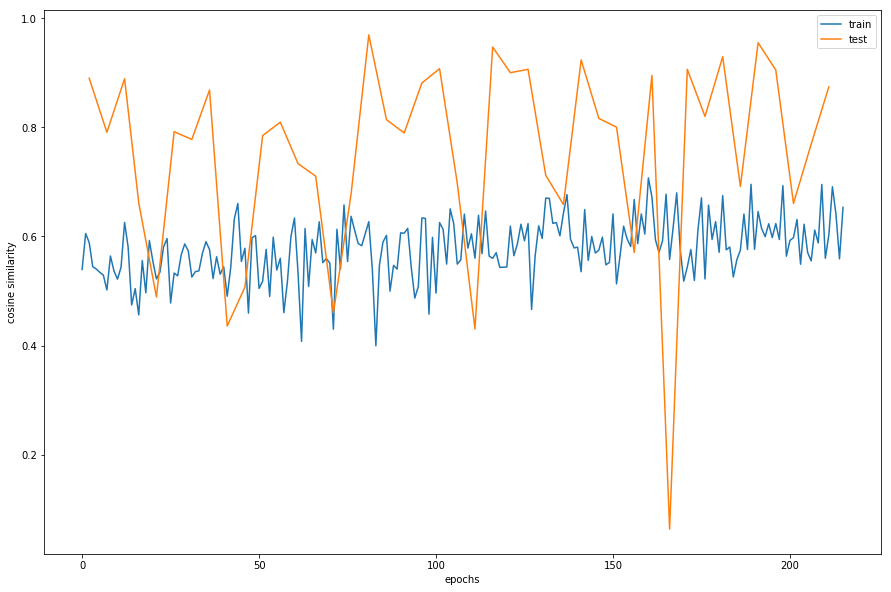

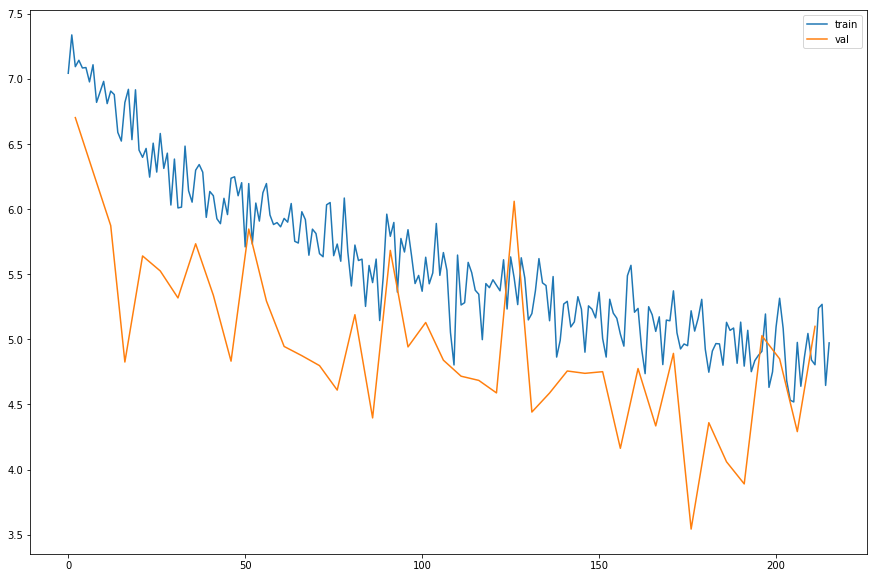

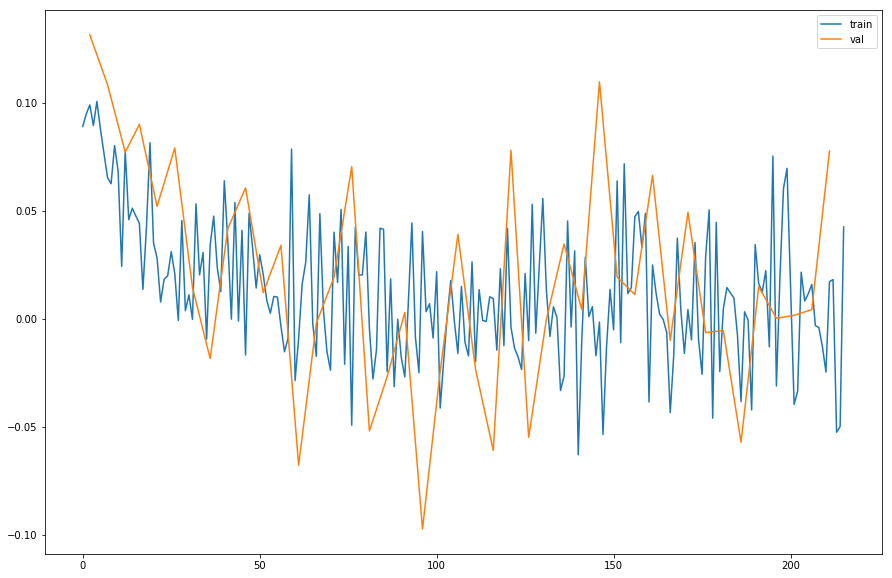

In [48]:
trainer.train(batcher, trainer_params)

Train:
same_user_original 0.9778424167011663
same_user 0.7278299885656819
same_problem_user 0.4887539997986663
Test:
same_user_original 0.9794888597640892
same_user 0.7042985777389449
same_problem_user 0.5817590165525945


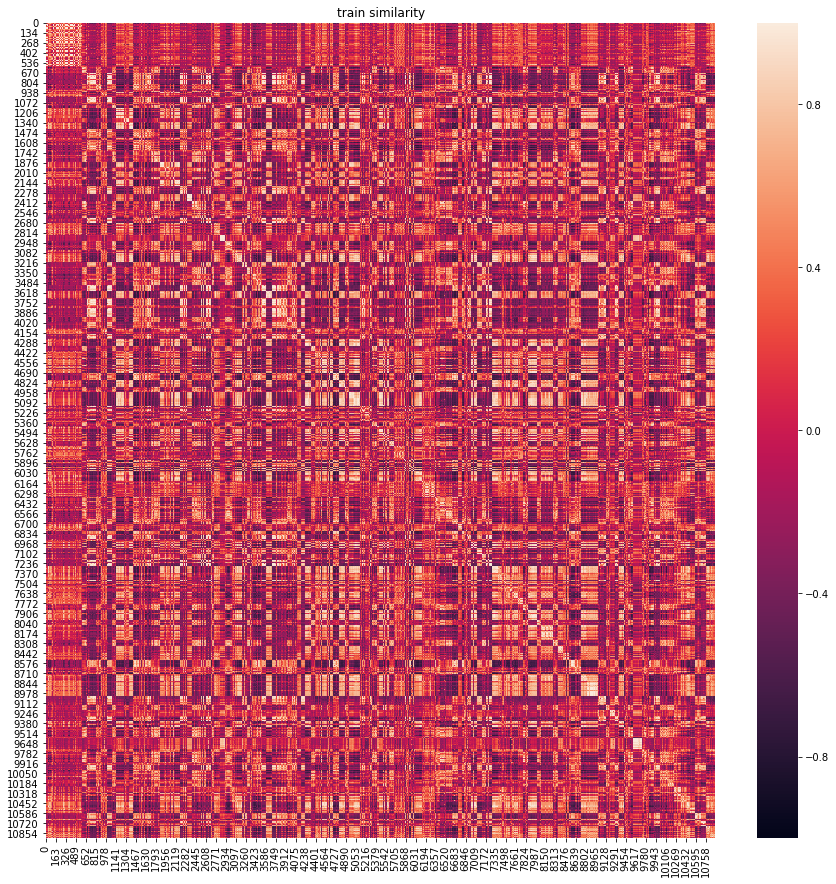

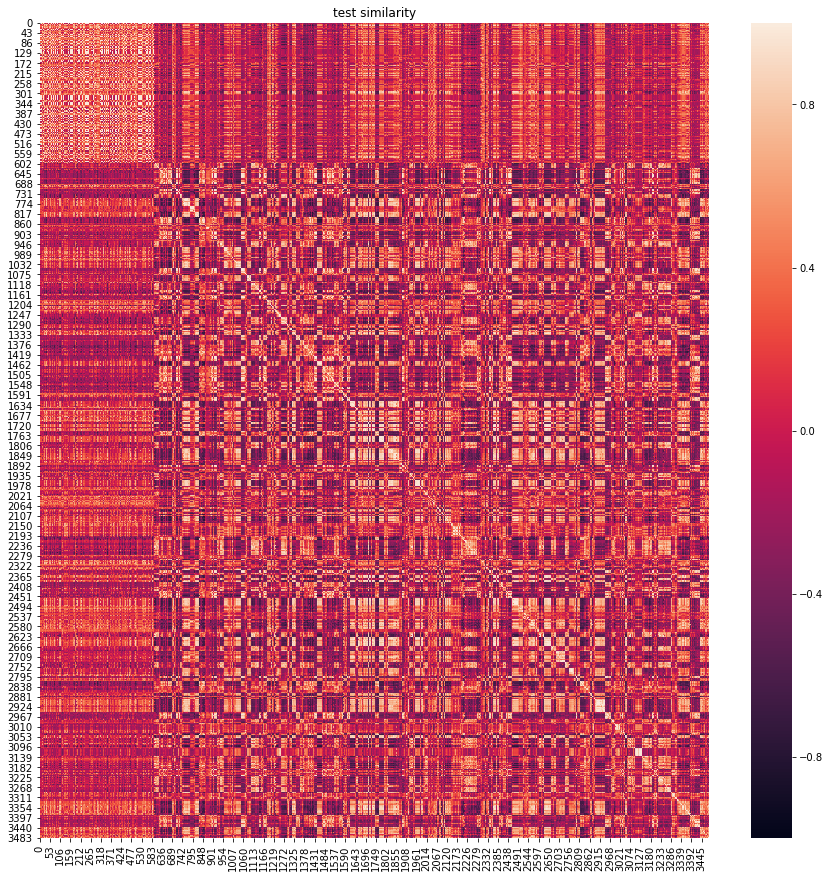

In [49]:
validation_result = obfuscated_trainer.validate(ast_encoder, batcher, long_names, obfuscation_params, max_for_user=100, n_obfuscated=5)

In [ ]:
validation_result = obfuscated_trainer.validate(ast_encoder, batcher, long_names, obfuscation_params_subseq, max_for_user=100, n_obfuscated=5)

Train:
same_user_original 0.8024348776553594
same_user 0.17962653655078906
same_problem_user 0.0119203879556104
Test:
same_user_original 0.597083879423329
same_user 0.1424154167273433
same_problem_user 0.017127202562982377


In [61]:
import seaborn as sns
def print_metrics(test_result):
#     print("Test:")
    counters = obfuscated_trainer.calculate_metric_counters(test_result["sim"], test_result["indices"], test_result["back_indices"])
    metrics = obfuscated_trainer.calculate_metrics(counters)
    for metric_name, metric in metrics.items():
        print(metric_name, np.mean(list(metric.values())))

    plt.figure(figsize=(15, 15))
    plt.title("test similarity")
    sns.heatmap(test_result["sim"], vmin=-1.0, vmax=1.0)

same_user_original 0.8024348776553594
same_user 0.17962653655078906
same_problem_user 0.0119203879556104


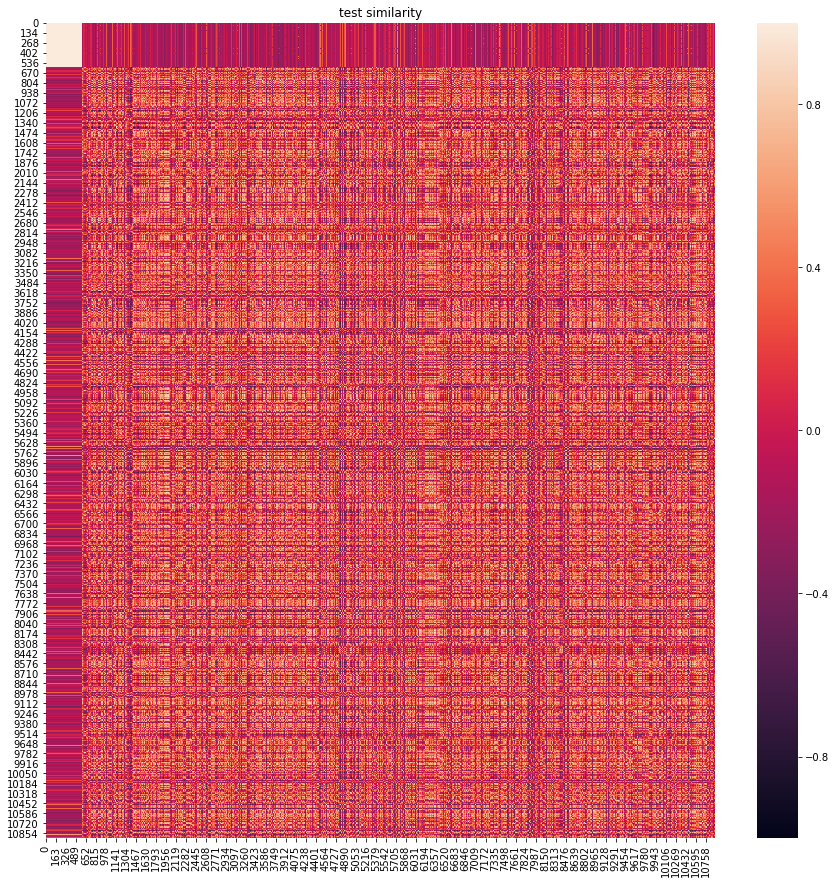

In [62]:
print_metrics(validation_result[0])

same_user_original 0.597083879423329
same_user 0.1424154167273433
same_problem_user 0.017127202562982377


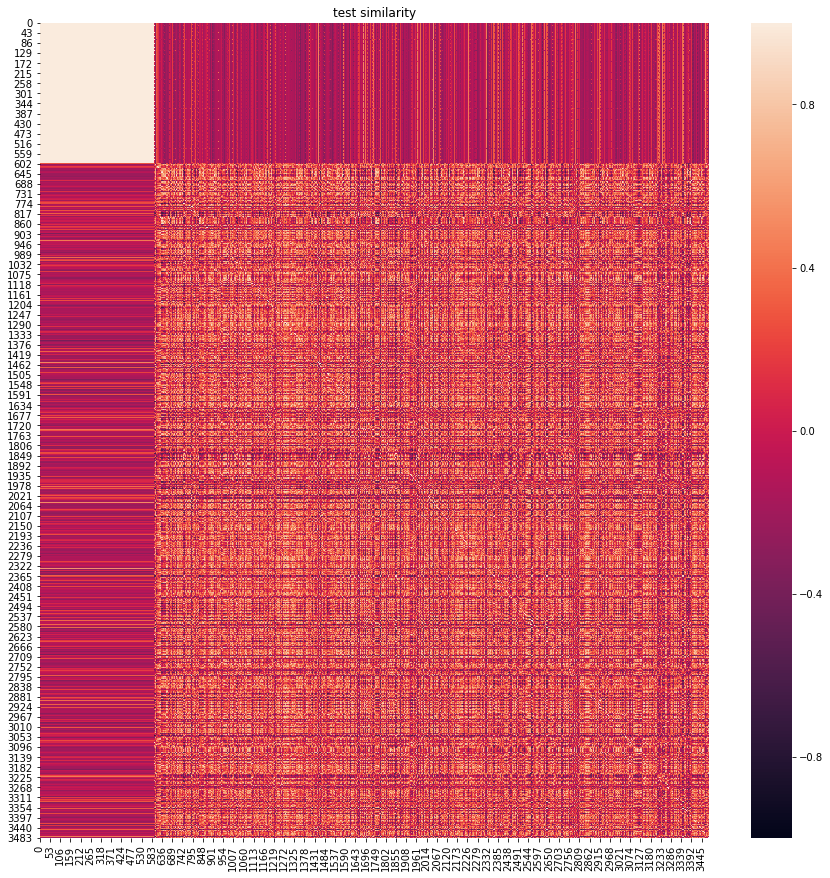

In [63]:
print_metrics(validation_result[1])

Train:
same_user_original 0.8066287243261993
same_user 0.8066287243261993
same_problem_user 0.0
Test:
same_user_original 0.6078891801368865
same_user 0.6078891801368865
same_problem_user 0.0


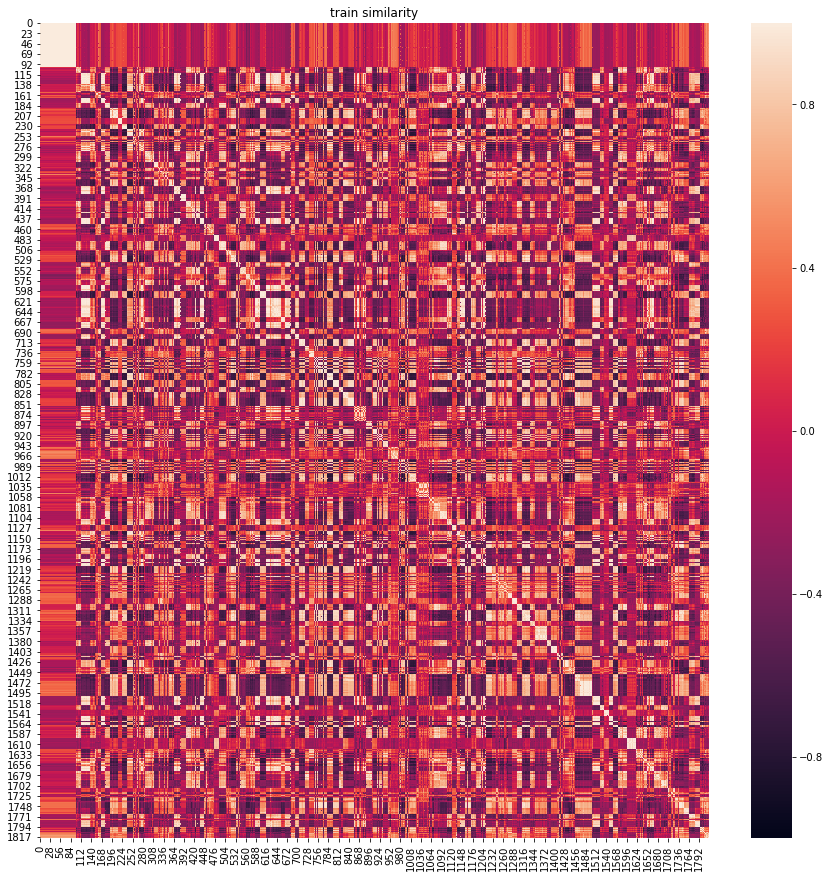

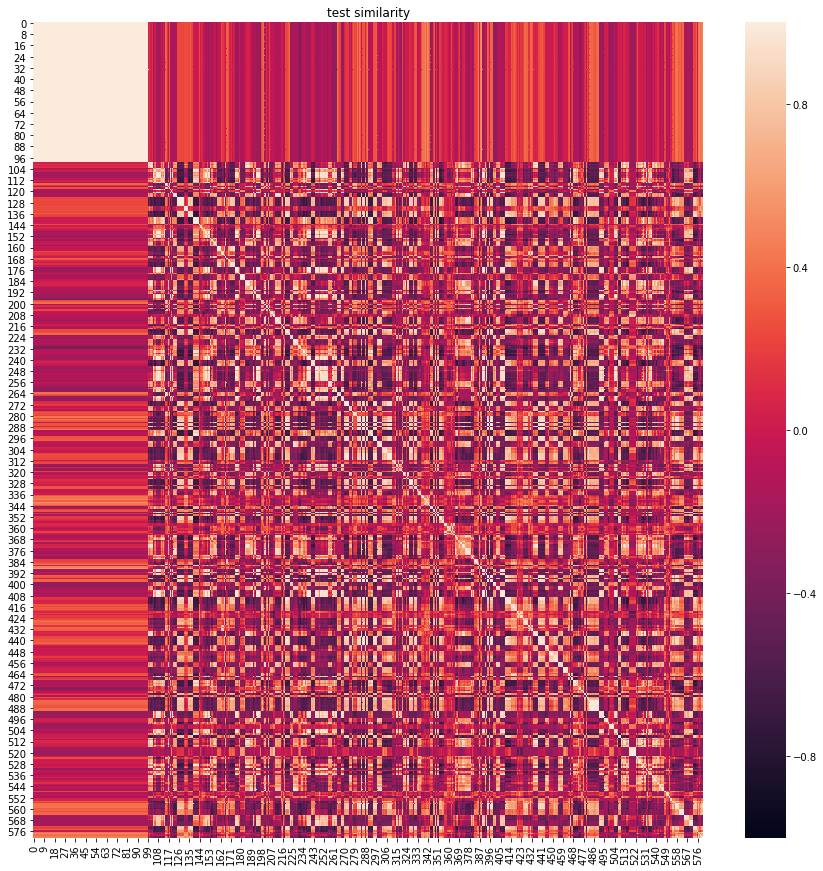

In [55]:
validation_result_0_obf = obfuscated_trainer.validate(ast_encoder, batcher, long_names, obfuscation_params, max_for_user=100, n_obfuscated=0)

In [53]:
# validation_result